## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
import sklearn
import scipy
import seaborn as sns

In [2]:
import matplotlib
matplotlib.rcParams["image.origin"] = 'upper'

In [3]:
import tqdm
#from tqdm import tqdm
from tqdm.notebook import tqdm # for notebooks
tqdm.pandas()

In [4]:
import pickle
import gc
collectAll = lambda : gc.collect(0) + gc.collect(1) + gc.collect(2)

In [5]:
from collections import namedtuple
import itertools
from itertools import product

In [6]:
from skimage.feature import graycomatrix
from skimage.feature import graycoprops
from math import pi

In [7]:
import PIL as pil
from PIL import Image, ImageDraw

In [8]:
import math

In [9]:
import sys
import os

In [10]:
import functools

In [11]:
import torch
import torchvision

In [12]:
from einops import *

In [13]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 4 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [14]:
import networkx as nx

In [15]:
from pathlib import Path

In [16]:
import umap
#Note: VERY HACKY: Manually fixed broken deps install.
import umap.plot
from umap import UMAP

E:\miniconda3\envs\up-to-date-env\Lib\site-packages\umap\plot.py:203: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(nopython=False)


## Load our captures

In [17]:
arr_10May2021 = rearrange(
    rio.open(Path('geotiffs') / '10May2021' / 'result_all_bands.tif').read(),
    'c h w -> h w c')

In [18]:
arr_18Dec2020 = rearrange(
    rio.open(Path('geotiffs') / '18Dec2020' / 'result_all_bands.tif').read(),
    'c h w -> h w c')

In [19]:
arr_93deg = rearrange(
    rio.open(Path('geotiffs') / '93deg' / 'result_all_bands.tif').read(),
    'c h w -> h w c')

In [20]:
arr_183deg = rearrange(
    rio.open(Path('geotiffs') / '183deg' / 'result_all_bands.tif').read(),
    'c h w -> h w c')

## Load our bounds

In [21]:
chestnut_bounds = pd.concat((pd.read_csv('10May2021_manual_bounds.csv', index_col=0),
                             pd.read_csv('18Dec2020_manual_bounds.csv', index_col=0)))

In [22]:
chestnut_bounds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 64 entries, 0 to 32
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name    64 non-null     object
 1   src     64 non-null     object
 2   uuid    64 non-null     object
 3   minr    64 non-null     int64 
 4   minc    64 non-null     int64 
 5   maxr    64 non-null     int64 
 6   maxc    64 non-null     int64 
dtypes: int64(4), object(3)
memory usage: 4.0+ KB


In [23]:
'Cratoxylum Formosum' in chestnut_bounds['name'].unique()

True

In [24]:
casuarina_bounds = pd.read_csv('casuarina bounds.csv', index_col=0)

In [25]:
casuarina_bounds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16 entries, 0 to 9
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name    16 non-null     object
 1   ymin    16 non-null     int64 
 2   ymax    16 non-null     int64 
 3   xmin    16 non-null     int64 
 4   xmax    16 non-null     int64 
 5   src     16 non-null     object
dtypes: int64(4), object(2)
memory usage: 896.0+ bytes


## Produce a unified dataframe

In [26]:
chesnut_bounds = chestnut_bounds.drop('uuid', axis=1)
chestnut_bounds = chesnut_bounds.rename(columns={
    'minr': 'ymin', 'minc': 'xmin', 'maxr': 'ymax', 'maxc': 'xmax'
})

In [27]:
chestnut_bounds['name'].unique()

array(['Falcataria Moluccana', 'Ficus Variegata', 'Bridelia Sp.',
       'Spathodea Campanulatum', 'Terminalia Catappa', 'Shorea Leprosula',
       'Syzygium Polyanthum', 'Cinnamomum Iners', 'Clausena Excavata',
       'Alstonia Angulstiloba', 'Sandoricum Koetjape',
       'Sterculia Parviflora', 'Claoxylon Indicum', 'Pometia Pinnata',
       'Calophyllum', 'Pennisetum Purpureum', 'Campnosperma Auriculatum',
       'Dillenia Suffruticosa', 'Cratoxylum Formosum'], dtype=object)

In [28]:
casuarina_bounds['name'].unique()

array(['Campnosperma N', 'Campnosperma S', 'Palm Tree', 'Campnosperma E',
       'macagi top', 'macagi top left', 'macagi middle', 'macagi bottom'],
      dtype=object)

In [29]:
casuarina_bounds['tree_name'] = casuarina_bounds['name']
casuarina_bounds['name'] = casuarina_bounds['name']\
    .apply(lambda x: 'Campnosperma Auriculatum' if 'campnosperma' in x.lower()
                      else 'Palm Tree' if 'palm' in x.lower()
                      else 'Macaranga Gigantea' if 'macagi' in x.lower() else None)

In [30]:
bounds = pd.concat((casuarina_bounds,
                    chestnut_bounds))

In [31]:
bounds = bounds.reset_index(drop=True)

In [32]:
counters = dict()
for index, row in bounds.iterrows():
    if row['src'] in ['10May2021', '18Dec2020']:
        if row['name'] not in counters:
            counters[row['name']] = 0
        else:
            counters[row['name']] += 1
        bounds.at[index, 'tree_name'] = "{} #{}".format(row['name'],
                                                        counters[row['name']])

In [33]:
bounds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80 entries, 0 to 79
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   name       80 non-null     object
 1   ymin       80 non-null     int64 
 2   ymax       80 non-null     int64 
 3   xmin       80 non-null     int64 
 4   xmax       80 non-null     int64 
 5   src        80 non-null     object
 6   tree_name  80 non-null     object
dtypes: int64(4), object(3)
memory usage: 4.5+ KB


In [34]:
bounds

,name,ymin,ymax,xmin,xmax,src,tree_name
0,Campnosperma Auriculatum,4017,4166,4305,4485,93deg,Campnosperma N
1,Campnosperma Auriculatum,4583,4702,4242,4421,93deg,Campnosperma S
2,Palm Tree,4471,4648,3706,3891,93deg,Palm Tree
3,Campnosperma Auriculatum,3833,3984,4717,4901,183deg,Campnosperma N
4,Campnosperma Auriculatum,4403,4520,4639,4795,183deg,Campnosperma S
...,...,...,...,...,...,...,...
75,Campnosperma Auriculatum,671,1006,3777,4026,18Dec2020,Campnosperma Auriculatum #1
76,Dillenia Suffruticosa,2931,2996,4064,4172,18Dec2020,Dillenia Suffruticosa #1
77,Sterculia Parviflora,3178,3319,3629,3756,18Dec2020,Sterculia Parviflora #7
78,Ficus Variegata,6466,6845,3372,3571,18Dec2020,Ficus Variegata #3


## Crop out the bounds from the captures

In [35]:
df_unified = bounds.copy()

In [36]:
crops = []
for index, row in df_unified.iterrows():
    name = row['name']
    src = row['src']
    match src:
        case '93deg':
            image = arr_93deg
        case '183deg':
            image = arr_183deg
        case '10May2021':
            image = arr_10May2021
        case '18Dec2020':
            image = arr_18Dec2020
        case _:
            image = None
    crop = image[row['ymin']:row['ymax'],row['xmin']:row['xmax']]
    crops.append(crop)
df_unified['crop'] = crops
del crops

## Display one of such crops for each capture and species

In [37]:
srcs = df_unified['src'].unique()
species = df_unified['name'].unique()

  0%|          | 0/84 [00:00<?, ?it/s]

E:\miniconda3\envs\up-to-date-env\Lib\site-packages\matplotlib\cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


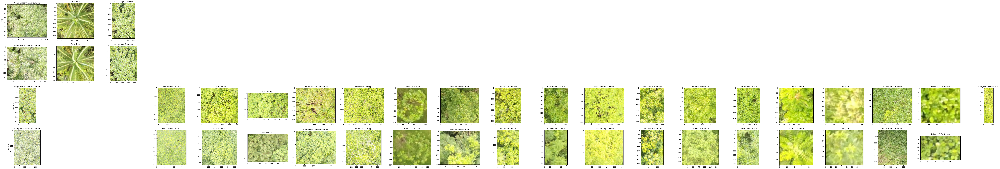

In [38]:
fig, ax = plt.subplots(nrows:=len(srcs),
                       ncols:=len(species),
                       figsize=(5.6*ncols,4.8*nrows))
pbar = tqdm(total=ax.size)
for row, src in zip(ax, srcs):
    for col, name in zip(row, species):
        filter = df_unified[(df_unified['name'] == name)
                          & (df_unified['src'] == src)]
        if len(filter) == 0:
            fig.delaxes(col)
            pbar.update()
            continue
        crop = filter.iloc[0]['crop']
        crop = crop[:,:,:3] / 256
        col.imshow(crop)
        col.set_title(name)
    row[0].set_ylabel(src)
    pbar.update()

## What if we take the central crops?

In [39]:
def crop_center(img,cropx,cropy):
    y,x = img.shape[:2]
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

  0%|          | 0/84 [00:00<?, ?it/s]

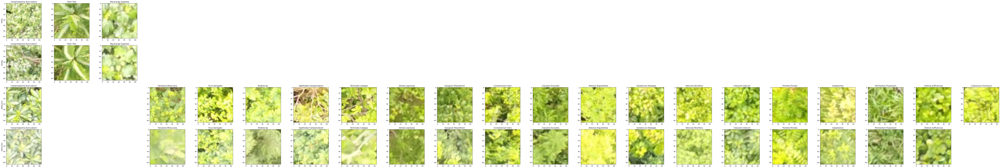

In [40]:
fig, ax = plt.subplots(nrows:=len(srcs),
                       ncols:=len(species),
                       figsize=(5.6*ncols,4.8*nrows))
pbar = tqdm(total=ax.size)
for row, src in zip(ax, srcs):
    for col, name in zip(row, species):
        filter = df_unified[(df_unified['name'] == name)
                          & (df_unified['src'] == src)]
        if len(filter) == 0:
            fig.delaxes(col)
            pbar.update()
            continue
        crop = filter.iloc[0]['crop']
        crop = crop_center(crop[:,:,:3] / 256, 64, 64)
        col.imshow(crop)
        col.set_title(name)
        pbar.update()
    row[0].set_ylabel(src)

## Examine the presence of NaNs in our crops

In [41]:
df_unified = pd.read_pickle('df_unified.pickle')

In [42]:
pixels_for_bands = np.concatenate(df_unified['crop'].apply(lambda x: x.reshape(-1, x.shape[-1])),
                                  axis=0)

In [43]:
pixels_for_bands= pd.DataFrame(pixels_for_bands)

In [44]:
len(pixels_for_bands)

9483213

In [45]:
pixels_for_bands.isnull().sum(axis=0)

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
dtype: int64

In [46]:
df_unified['crop'] = df_unified['crop'].apply(np.nan_to_num)

## Save our bounds and crops.

In [47]:
bounds.to_csv('unified bounds.csv')

In [48]:
df_unified.to_pickle('df_unified.pickle')